<a href="https://colab.research.google.com/github/rohansiddam/Python-Journey/blob/main/101%20-%20Lesson%20101%20(Detect%20Credit%20Card%20Defaulters%20-%20Decision%20Tree%203).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lesson 101: Detect Credit Card Defaulters - Decision Tree III

---

### Teacher-Student Activities

In the previous lesson, you calculated information gain values for creating decision tree.

In this class, you will continue creating a decision tree without using the `sklearn` module.

Let's quickly go through the activities covered in the previous lesson and begin this lesson from the **Activity 1: Building Decision Tree** section.

---

#### Detect Credit Card Defaulters - Problem Statement

The Taiwanese bank has issued credit cards to many of its clients. They have maintained a dataset of credit card `DEFAULTERS` for a period from April 2005 to September 2005.

You need to build a **Decision Tree** model to predict whether or not the client will pay the credit card bill for the next month.

Predicting accurately which customers are most probable to default represents a significant business opportunity for all banks. This can improve the customer screening process and also helps in assessing the credibility of the customer. It also helps banks in reducing the spending limit of the credit card holder or initiate legal steps for amount recovery.

**Dataset Description**

The dataset contains 30,000 rows and 25 columns. Each column represents an attribute of the customer as described in the table below.

|Sr No.|Attribute|Attribute Information|
|-|-|-|
|1|ID|ID of each customer, which has been masked to display serial number to hide confidential customer information (Integer)|
|2|LIMIT_BAL|Amount of given credit in NT dollars (including supplementary credit cards) (Float)|
|3|SEX|Gender (1=male, 2=female) (Integer)|
|4|EDUCATION| (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown) (Integer)|
|5|MARRIAGE|Marital status (1=married, 2=single, 3=others) (Integer)|
|6|AGE|Customer age in years (Integer)|
|7|PAY_0|Repayment status in September, 2005 (-1=paid on time, 1=payment delay for one month, 2=payment delay for two months, … , 8=payment delay for eight months and above) (Integer)|
|8|PAY_2|Repayment status in August, 2005 (scale same as above) (Integer)|
|9|PAY_3|Repayment status in July, 2005 (scale same as above) (Integer)|
|10|PAY_4|Repayment status in June, 2005 (scale same as above) (Integer)|
|11|PAY_5|Repayment status in May, 2005 (scale same as above) (Integer)|
|12|PAY_6|Repayment status in April, 2005 (scale same as above) (Integer)|
|13|BILL_AMT1|Amount of bill statement in September, 2005 (NT dollar) (Float)|
|14|BILL_AMT2|Amount of bill statement in August, 2005 (NT dollar) (Float)|
|15|BILL_AMT3|Amount of bill statement in July, 2005 (NT dollar) (Float)|
|16|BILL_AMT4|Amount of bill statement in June, 2005 (NT dollar) (Float)|
|17|BILL_AMT5|Amount of bill statement in May, 2005 (NT dollar) (Float)|
|18|BILL_AMT6|Amount of bill statement in April, 2005 (NT dollar) (Float)|
|19|PAY_AMT1|Amount of previous payment in September, 2005 (NT dollar) (Float)|
|20|PAY_AMT2|Amount of previous payment in August, 2005 (NT dollar) (Float)|
|21|PAY_AMT3|Amount of previous payment in July, 2005 (NT dollar) (Float)|
|22|PAY_AMT4|Amount of previous payment in June, 2005 (NT dollar) (Float)|
|23|PAY_AMT5|Amount of previous payment in May, 2005 (NT dollar) (Float)|
|24|PAY_AMT6|Amount of previous payment in April, 2005 (NT dollar) (Float)|
|25|default.payment.next.month|Default payment (1=yes, 0=no) (Integer)|

<br>

This data set consists of the following key features:
- The payment status for 6 previous bill cycles
- The outstanding bill amount and the repayment status along with the amount paid
- The demographic information of the customers

The target column of this dataset is `default.payment.next.month` which classifies the customer into two categories:
- `1` (yes) - means the customer is not going to pay for the next month's bill and hence will be termed as a **defaulter**.
- `0` (no) - means the customer will pay the bill for the next month and will be termed as a **non-defaulter**.


Some ideas for exploration:
1. How does the probability of default payment vary by categories of different demographic variables?
2. Which variables are the strongest predictors of default payment?


**Dataset source:** https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients

**Citation:**  Yeh, I. C., & Lien, C. H. (2009). The comparisons of data mining techniques for the predictive accuracy of probability of default of credit card clients. Expert Systems with Applications, 36(2), 2473-2480.

---

#### Importing Modules & Reading Data

Here is the link to the dataset:
https://s3-student-datasets-bucket.whjr.online/whitehat-ds-datasets/uci-credit-card-fraud/UCI_Credit_Card.csv

In [ ]:
# Import the modules, read the dataset and create a Pandas data frame.
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

cc_client_csv = 'https://s3-student-datasets-bucket.whjr.online/whitehat-ds-datasets/uci-credit-card-fraud/UCI_Credit_Card.csv'
df = pd.read_csv(cc_client_csv)

# Print the first five records
print(df.head(), "\n" + "-" * 100)

# Get the total number of rows and columns, data types of columns and missing values (if exist) in the dataset.
print(df.info(), "\n" + "-" * 100)

# Rename 'PAY_0' to 'PAY_1', and 'default.payment.next.month' to 'DEFAULT'.
df.rename(columns = {"PAY_0": "PAY_1"}, inplace = True)
df.rename(columns = {"default.payment.next.month": "DEFAULT"}, inplace = True)

# Check whether the names of the two columns are changed or not.
for i in range(df.shape[1]):
  print(f"At index {i:02}, {df.columns[i]}")
print("-" * 100)

   ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  PAY_4  \
0   1    20000.0    2          2         1   24      2      2     -1     -1   
1   2   120000.0    2          2         2   26     -1      2      0      0   
2   3    90000.0    2          2         2   34      0      0      0      0   
3   4    50000.0    2          2         1   37      0      0      0      0   
4   5    50000.0    1          2         1   57     -1      0     -1      0   

   ...  BILL_AMT4  BILL_AMT5  BILL_AMT6  PAY_AMT1  PAY_AMT2  PAY_AMT3  \
0  ...        0.0        0.0        0.0       0.0     689.0       0.0   
1  ...     3272.0     3455.0     3261.0       0.0    1000.0    1000.0   
2  ...    14331.0    14948.0    15549.0    1518.0    1500.0    1000.0   
3  ...    28314.0    28959.0    29547.0    2000.0    2019.0    1200.0   
4  ...    20940.0    19146.0    19131.0    2000.0   36681.0   10000.0   

   PAY_AMT4  PAY_AMT5  PAY_AMT6  default.payment.next.month  
0       0.0       0.0   

#### Data Analysis


In [ ]:
# Get the counts of defaulters and non-defaulters to see whether the former are in large numbers or the latter.
print("Count of defaulters and non-defaulters.")
print(df['DEFAULT'].value_counts(), "\n" + "-" * 100)

# Get the percentage of defaulters and non-defaulters.
print("Percentage of defaulters and non-defaulters.")
print(df['DEFAULT'].value_counts(normalize = True), "\n" + "-" * 100) # The 'normalize = True' returns the counts as fractions of the total.

# Calculate the number of male and female clients out of all the defaulters.
grp_gender_df = df[['ID', 'SEX', 'DEFAULT']].groupby(by = ['DEFAULT', 'SEX']).count()
print("The number of male and female clients out of all the defaulters.")
print(grp_gender_df, "\n" + "-" * 100)

# Out of all the defaulters, calculate the number of credit card clients having different education qualifications.
grp_edu_df = df[['ID', 'EDUCATION', 'DEFAULT']].groupby(by = ['DEFAULT', 'EDUCATION']).count()
print("The number of credit card clients having different education qualifications out of the total defaulters.")
print(grp_edu_df, "\n" + "-" * 100)

Count of defaulters and non-defaulters.
0    23364
1     6636
Name: DEFAULT, dtype: int64 
----------------------------------------------------------------------------------------------------
Percentage of defaulters and non-defaulters.
0    0.7788
1    0.2212
Name: DEFAULT, dtype: float64 
----------------------------------------------------------------------------------------------------
The number of male and female clients out of all the defaulters.
                ID
DEFAULT SEX       
0       1     9015
        2    14349
1       1     2873
        2     3763 
----------------------------------------------------------------------------------------------------
The number of credit card clients having different education qualifications out of the total defaulters.
                      ID
DEFAULT EDUCATION       
0       0             14
        1           8549
        2          10700
        3           3680
        4            116
        5            262
        6            

In [ ]:
# Calculate the counts of different categorical values in the 'EDUCATION' column.
df['EDUCATION'].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: EDUCATION, dtype: int64

In [ ]:
# Remove redundancy in the 'EDUCATION' column.
df.loc[df['EDUCATION'] == 0, 'EDUCATION'] = 5
df.loc[df['EDUCATION'] == 6, 'EDUCATION'] = 5

# Calculate the count of all the labels again in the 'EDUCATION' column.
print(df['EDUCATION'].value_counts(), "\n" + "-" * 100)

# Calculate the number of clients based on the marriage status out of all the defaulters.
grp_gender_df = df[['ID', 'MARRIAGE', 'DEFAULT']].groupby(by = ['DEFAULT', 'MARRIAGE']).count()
print(grp_gender_df, "\n" + "-" * 100)

2    14030
1    10585
3     4917
5      345
4      123
Name: EDUCATION, dtype: int64 
----------------------------------------------------------------------------------------------------
                     ID
DEFAULT MARRIAGE       
0       0            49
        1         10453
        2         12623
        3           239
1       0             5
        1          3206
        2          3341
        3            84 
----------------------------------------------------------------------------------------------------


In [ ]:
# Remove redundancy in the 'EDUCATION' column.
df.loc[df['MARRIAGE'] == 0, 'MARRIAGE'] = 3

# Calculate the count of all the labels again in the 'EDUCATION' column.
print(df['MARRIAGE'].value_counts(), "\n" + "-" * 100)

# Out of all the defaulters, calculate the number of credit card clients having different education qualifications.
grp_marriage_df = df[['ID', 'MARRIAGE', 'DEFAULT']].groupby(by = ['DEFAULT', 'MARRIAGE']).count()
print("The number of credit card clients having different education qualifications out of all the defaulters.")
print(grp_marriage_df, "\n" + "-" * 100)

# Calculate the mean and median age of defaulters and non-defaulters.
grp_age_df = df[['AGE', 'DEFAULT']].groupby(by = 'DEFAULT').agg(func = ['mean', 'std', 'median'])
print("The mean and median age of defaulters and non-defaulters.")
print(grp_age_df, "\n" + "-" * 100)

# Calculate the mean and median 'LIMIT_BAL' of defaulters and non-defaulters.
grp_limit_bal_df = df[['LIMIT_BAL', 'DEFAULT']].groupby(by = 'DEFAULT').agg(func = ['mean', 'std', 'median'])
print("The mean and median 'LIMIT_BAL' of defaulters and non-defaulters.")
print(grp_limit_bal_df, "\n" + "-" * 100)

2    15964
1    13659
3      377
Name: MARRIAGE, dtype: int64 
----------------------------------------------------------------------------------------------------
The number of credit card clients having different education qualifications out of all the defaulters.
                     ID
DEFAULT MARRIAGE       
0       1         10453
        2         12623
        3           288
1       1          3206
        2          3341
        3            89 
----------------------------------------------------------------------------------------------------
The mean and median age of defaulters and non-defaulters.
               AGE                 
              mean       std median
DEFAULT                            
0        35.417266  9.077355   34.0
1        35.725738  9.693438   34.0 
----------------------------------------------------------------------------------------------------
The mean and median 'LIMIT_BAL' of defaulters and non-defaulters.
             LIMIT_BAL           

---

In [ ]:
# Create the feature and target dataset for training and testing the model.

# Import the required libraries
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
# The 'plot_confusion_matrix' function allows us to plot a confusion_matrix heatmap in one go.

feature_columns = list(df.columns)
feature_columns.remove('DEFAULT')
feature_columns.remove('ID')

X = df[feature_columns]
y = df['DEFAULT']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 30)

# Modeling a decision tree.
dtree_clf = DecisionTreeClassifier()
dtree_clf.fit(X_train, y_train)
y_train_pred = dtree_clf.predict(X_train)
y_test_pred = dtree_clf.predict(X_test)

print(f"Accuracy on the train set: {metrics.accuracy_score(y_train, y_train_pred):.4f}\n")
print(f"Accuracy on the test set: {metrics.accuracy_score(y_test, y_test_pred):.4f}")

Accuracy on the train set: 0.9995

Accuracy on the test set: 0.7264


---

#### Plot Decision Tree



In [ ]:
# Create an actual decision tree for the decision tree classifier you have built so far.
# Import the required modules.
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus


dot_data = StringIO()
export_graphviz(decision_tree = dtree_clf, out_file = dot_data, filled = True, rounded = True,
                feature_names = feature_columns, class_names = ['0', '1']
                )

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.246167 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.246167 to fit



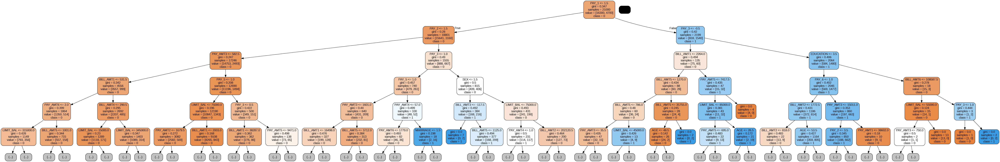

In [ ]:
# Resize the above decision tree using the 'max_depth' parameter.
dot_data = StringIO()
export_graphviz(dtree_clf, max_depth = 5, out_file = dot_data, filled = True, rounded = True,
                feature_names = feature_columns, class_names = ['0','1']
                )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Credit_Card_Tree.png')
Image(graph.create_png())

`Tip`: Click anywhere in the tree image to zoom in/out of the tree. The tree structure can be downloaded as a `.png` image.


---

#### Decision Tree Algorithm - Gini Index Calculation

In order to better understand the steps in the formation of a decision tree using **gini index** as an attribute selection measure, consider a very small snippet from the credit card defaulter dataset:

Gender | Education | Default
--- | --- | ---
`Male` | `Unknown` | `Yes`
`Female` | `High School` | `No`
`Male` | `High School` | `No`
`Female` | `Graduate` | `Yes`
`Male` | `Graduate` | `No`

**Note:** This is a very small subset of the entire data. Hence, do not try to infer the main decision tree using this dataset. The decision tree resulting from this dataset is meant only for understanding the gini index calculation process.

Let us try to find out the decision tree for classifying the defaulter based on the 2 attributes listed in the table above.



#### Determining a Root Node

There are 2 features (Education and Gender) in the above table. This implies that we have two candidates for root nodes: (a) Gender (b) Education


**Splitting Root Node wrt Gender**

Let us first calculate the gini index for the **Gender** column.

There are 2 instances of `Female` value in the **Gender** column: one of them is a `defaulter` (represented by `Yes` or `1`) and another is a `non-defaulter` (represented by
`No` or `0`)

- So, the probability of a `Female` credit card client being a `defaulter` is $p_1 = \frac{1}{2}$

- Similarly, the probability of a `Female` credit card client being a `non-defaulter` is $p_2 = \frac{1}{2}$

Let the gini index of the `Female` value be $f$.

Therefore, the gini index of $f$ is given by

$$f = 1 - \sum_{i = 1}^{N} (p_{i})^2$$

Here, $N = 2$ because there are only two probabilities, i.e., $p_1$ and $p_2$. So, the value of $i$ also goes from $1$ to $2$.

\begin{align}
\therefore f &= 1 - \sum_{i = 1}^{N} (p_{i})^2 \\
&= 1 - ( p_1^2 + p_2^2 )
\end{align}

On substituting the values of $p_1 = \frac{1}{2}$ and $p_2 = \frac{1}{2}$ in the above equation, we get

\begin{align}
&= 1 - \left( \left(\frac{1}{2}\right)^2 + \left(\frac{1}{2}\right)^2 \right) \\
&= 1 - \frac{1}{2} \\
\Rightarrow f &= 0.5
\end{align}

Similarly, there are 3 instances of `Male` value in the **Gender** column: one of them is a `defaulter` (represented by `Yes` or `1`) and two of them are `non-defaulter` (represented by
`No` or `0`)

- So, the probability of a `Male` credit card client being a `defaulter` is $p_1 = \frac{1}{3}$

- Similarly, the probability of a `Male` credit card client being a `non-defaulter` is $p_2 = \frac{2}{3}$

Let the gini index of the `Male` value be $m$.

Therefore, the gini index of $m$ is given by

$$m = 1 - \sum_{i = 1}^{N} (p_{i})^2$$

Here, $N = 2$ because there are only two probabilities, i.e., $p_1$ and $p_2$. So, the value of $i$ also goes from $1$ to $2$.

\begin{align}
\therefore m &= 1 - \sum_{i = 1}^{N} (p_{i})^2 \\
&= 1 - ( p_1^2 + p_2^2 )
\end{align}

On substituting the values of $p_1 = \frac{1}{3}$ and $p_2 = \frac{2}{3}$ in the above equation, we get

\begin{align}
&= 1 - \left( \left(\frac{1}{3}\right)^2 + \left(\frac{2}{3}\right)^2 \right) \\
&= 1 - \frac{5}{9} \\
\Rightarrow m &= 0.444
\end{align}

The next step is to calculate the **weighted gini index** value for the **Gender** column in the above table.

**Weighted Gini Index (WG)**

The weighted gini index is defined as the weighted average of the gini indices of all the unique values in a column (or feature). In the case of the above table, the weighted gini index is the weighted average of the gini indices of the `Female` and `Male` values.

Mathematically, WG is defined as

$$\text{WG} = (\text{proportion of Female instances in the Gender column}) \times (\text{Gini Index of Female}) + (\text{proportion of Male instances in the Gender column}) \times (\text{Gini Index of Male})$$

In general, the WG of a column (or feature) is given as

$$\text{WG} = (\text{proportion of } \text{Value}_1 \text{ instances}) \times (\text{Gini Index of Value}_1) + (\text{proportion of } \text{Value}_2 \text{ instances}) \times (\text{Gini Index of Value}_2) + \dots + (\text{proportion of } \text{Value}_k \text{ instances}) \times (\text{Gini Index of Value}_k)$$

where $k$ is the total number of unique values in a column (or feature).

**Note:** *Weighted Gini Index is taken as the final Gini Index value for a column*

If we split a decision tree the **Gender**, then we will get 2 nodes: `Male` and `Female`. The total number of samples in the **Gender** column is 5.

Out of 5 data points in the **Gender** column, 2 are `Female`, and 3 are `Male`.

- So, the proportion of `Female` instances = $\frac{2}{5}$

- And, the proportion of `Male` instances = $\frac{3}{5}$

Therefore, the $\text{WG}$ for the **Gender** column is

\begin{align}
\text{WG} = \left(\frac{2}{5}\right) \times 0.5 + \left(\frac{3}{5}\right) \times 0.444 = 0.4664
\end{align}

This means if we split the tree using the **Gender** feature as the root node, we get a Weighted Gini Index of $0.4664$



---

**Splitting Root Node wrt Education**

Let us now calculate the gini index for the **Education** column.

There are 2 instances of `Graduate` in the **Education** column: one of them is a `defaulter` and another is a `non-defaulter`.

- So, the probability of a `Graduate` credit card client being a `defaulter` is $p_1 = \frac{1}{2}$

- Similarly, the probability of a `Graduate` credit card client being a `non-defaulter` is $p_2 = \frac{1}{2}$

Let the gini index for `Graduate` value be $g$.

Therefore, gini index of $g$ is given by

$$g = 1 - \sum_{i = 1}^{N} (p_{i})^2$$

Here, $N = 2$ because there are only two probabilities, i.e., $p_1$ and $p_2$. So, the value of $i$ also goes from $1$ to $2$.

\begin{align}
\therefore g &= 1 - \sum_{i = 1}^{N} (p_{i})^2 \\
&= 1 - ( p_1^2 + p_2^2 )
\end{align}

On substituting the values of $p_1 = \frac{1}{2}$ and $p_2 = \frac{1}{2}$ in the above equation, we get

\begin{align}
&= 1 - \left( \left(\frac{1}{2}\right)^2 + \left(\frac{1}{2}\right)^2 \right) \\
&= 1 - \frac{1}{2} \\
\Rightarrow g &= 0.5
\end{align}

Similarly, there are 2 instances of `High School` value in the **Education** column and both are `non-defaulter`.

- So, the probability of a `High School` graduate credit card client being a `defaulter` is $p_1 = \frac{0}{2} = 0$

- Similarly, the probability of a `High School` graduate credit card client being a `non-defaulter` is $p_2 = \frac{2}{2} = 1$

Let the gini index of the `High School` value be $h$.

Therefore, gini index of $h$ is given by

$$h = 1 - \sum_{i = 1}^{N} (p_{i})^2$$

Here, $N = 2$ because there are only two probabilities, i.e., $p_1$ and $p_2$. So, the value of $i$ also goes from $1$ to $2$.

\begin{align}
\therefore h &= 1 - \sum_{i = 1}^{N} (p_{i})^2 \\
&= 1 - ( p_1^2 + p_2^2 )
\end{align}

On substituting the values of $p_1 = \frac{1}{3}$ and $p_2 = \frac{2}{3}$ in the above equation, we get

\begin{align}
&= 1 - \left( 0^2 + 1^2 \right) \\
&= 1 - 1 \\
\Rightarrow h &= 0
\end{align}

Similarly, there is 1 instance of `Unknown` value in the **Education** column and it is a `defaulter`.

So, the probability of an `Unknown` graduate credit card client being a `defaulter` is $p_1 = \frac{1}{1} = 1$

Let the gini index of the `Unknown` value be $u$.

Therefore, the gini index of $u$ is given by

$$u = 1 - \sum_{i = 1}^{N} (p_{i})^2$$

Here, $N = 1$ because there is only one probability, i.e., $p_1$. So, the value of $i$ also goes from $1$ to $1$.

\begin{align}
\therefore u &= 1 - \sum_{i = 1}^{N} (p_{i})^2 \\
&= 1 - p_1^2
\end{align}

On substituting the value of $p_1 = \frac{1}{3}$ in the above equation, we get

\begin{align}
&= 1 - \left( 0^2 + 1^2 \right) \\
&= 1 - 1 \\
\Rightarrow u &= 0
\end{align}

The next step is to calculate the **weighted gini index** value for the **Education** column.

Out of 5 data points in the **Education** column, 1 is `Unknown`, 2 are `Graduate`, and 2 are `High School`.

- So, the proportion of `Graduate` instances = $\frac{2}{5}$

- The proportion of `High School` instances = $\frac{2}{5}$

- And, the proportion of `Unknown` instances = $\frac{1}{5}$

Therefore, the $\text{WG}$ for the **Education** column is

\begin{align}
\text{WG} = \left(\frac{2}{5}\right) \times 0.5 + \left(\frac{2}{5}\right) \times 0 + \left(\frac{1}{5}\right) \times 0 = 0.2
\end{align}

This means if we split the tree using the **Education** feature as the root node, we get a Weighted Gini Index of $0.2$


*Hence, we will choose <u>Education</u> as the <u>root node</u> as it produces the lowest Gini Index value.*

The decision tree using the **Education** column as the root node can be drawn as:

<img src = "https://student-datasets-bucket.s3.ap-south-1.amazonaws.com/images/decision-tree-example-4.png">

<br>

---

**Pure Node:** A node that has sample(s) of only 1 label is called a pure node. The splitting operation continues in a decision tree until all the sub-nodes obtained after splitting are pure nodes.

**Impure Node:** Any node that has sample(s) that are a combination of 2 or more labels is an impure node. Other than leaf nodes, all nodes of a decision tree are impure nodes.

---

<br>

After this, there is only 1 feature left i.e. **Gender** with 1 defaulter and 1 non-defaulter. The split of the **Gender** column is straightforward, hence, no need to calculate the gini for splitting the decision tree further.

**Note:** This tree is obtained from a very small subset of the entire data, hence might not look like the original decision tree made from the entire dataset.

---

#### Decision Tree Algorithm - Information Gain

Let's now learn another ASM technique called information gain that is meant to select the best attribute or feature to split a decision tree. However, information gain is based on the entropy of a dataset. Let us first understand the concept of entropy.


**Entropy** signifies the randomness in a dataset. It is a metric that measures impurity. A less impure node requires less information to describe it and a more impure node requires more information. Information theory is a measure to define this degree of disorganisation in a system known as entropy. If a sample is completely homogeneous (having the same type of values), then the entropy is zero and if the sample is equally divided (50—50%), it has an entropy of one. The entropy of a dataset $S$ is calculated as follows.

\begin{align}
\text{Entropy}(S) = - \sum_{i=1}^{N}p_{i} \times \log_{2}(p_{i})
\end{align}

where $p_i$ is the probability of an object classified as a class (or label).

**Information Gain (IG)** is the measurement of changes in entropy value after the splitting/segmentation of a dataset wrt on an attribute.

IG is calculated as:

\begin{align}
\text{IG} = \text{Entropy(S)} - [\text{Weighted average of Entropy of each unique value of a feature}]
\end{align}

or simply

\begin{align}
\text{IG} = \text{Entropy}(S_{b}) - \text{Entropy}(S_{a})
\end{align}

where,
- $S$ is a dataset
- $S_b$ is a dataset before split and $S_a$ is the dataset after the split

When we build a decision tree, we prefer splitting the nodes across the attribute/feature which has maximum information gain after splitting through the root node.

Once we find out the root node we proceed again with the gini index calculations for the sub-node(s) formed after splitting. This process is repeated continuously until we reach all the leaf node(s) for every possible split.

#### Decision Tree Algorithm - Information Gain Calculation

In order to better understand the steps for the formation of a decision tree, let us take yet another very small snippet from the credit card defaulter dataset and understand the process:

Gender | Education | Default
--- | --- | ---
`Male` | `Unknown` | `Yes`
`Male` | `High School` | `No`
`Female` | `High School` | `No`
`Male` | `Graduate` | `No`
`Female` | `Graduate` | `Yes`

**Note:**  The above table is a very small subset of the entire dataset, hence do not try to infer the main decision tree using this dataset.

Let us try to create a decision tree to identify credit card defaulters wrt Education and Gender.

#### Determining Root Node

There are two possibilities for root nodes: (a) Gender (b) Education

First, we will calculate the entropy of the above table. We know that entropy is given by

\begin{align}
\text{Entropy} = -\sum_{i=1}^{N}p_{i}\times \log_{2}(p_{i})
\end{align}

In the above table, we have 5 samples in total out of which 2 are defaulters and 3 non-defaulters.

Let $p_1$ and $p_2$ be the probability of defaulters and non-defaulters respectively.

- So, the probability of defaulters $p_1 = \frac{2}{5}$

- And, the probability of non-defaulters $p_2 = \frac{3}{5}$

Therefore, the entropy of the table $S$ before the split is given by

\begin{align}
\text{Entropy}(S_b) &= - (p_1 \times \log_{2}(p_1) + p_2 \times \log_{2}(p_2))
\end{align}

On substituting $p_1 = \frac{2}{5}$ and $p_2 = \frac{3}{5}$ in the above equation, we get

\begin{align}
 &= - \left( \left( \frac{2}{5}\right) \times \log_{2} \left( \frac{2}{5}\right) + \left( \frac{3}{5}\right) \times \log_{2}\left(\frac{3}{5}\right) \right) \\
 &= 0.97
\end{align}

Hence, the entropy of the table (considered for IG calculation) before the split is $0.971$

You can verify this value by calculating it through Python code.

In [ ]:
# Calculate the entropy value of the table (considered for IG calculation) before the split.
import numpy as np

-((2/5) * np.log2(2/5) + (3/5) * np.log2(3/5))

0.9709505944546686

**Splitting Root Node wrt Gender**

Let us split the root node wrt the **Gender** column.

There are 3 instances of `Male` in the table. Out of them, one is a defaulter and 2 are non-defaulters.

Let $p_1$ and $p_2$ be the probabilities of `Male` defaulter(s) and `Male` non-defaulter(s) respectively.

- So, the probability of `Male` defaulters $p_1 = \frac{1}{3}$

- And, the probability of `Male` non-defaulters $p_2 = \frac{2}{3}$

Male | Defaulter | Non-defaulter
--- | --- | --- |
Count | $1$ | $2$ |
$p_i$ | $\frac{1}{3}$ | $\frac{2}{3}$ |
$$p_i \times \log_2 (p_{i})$$ | $$\frac{1}{3} \times \log_2 \left(\frac{1}{3}\right) = -0.53$$| $$\frac{2}{3} \times \log_2 \left(\frac{2}{3}\right) = -0.39$$ |

You can verify these values by calculating them through a Python code.

In [ ]:
# Calculate the p_i * log_2 (p_i) value(s)
print((1/3) * np.log2(1/3))
print((2/3) * np.log2(2/3))

-0.5283208335737187
-0.38997500048077083


Therefore, the entropy value wrt to the `Male` instances is

\begin{align}
\text{Entropy} &= - (p_{1} \times \log_{2}(p_{1}) + p_{2}\times \log_{2}(p_{2})) \\
&= - (- 0.53  - 0.39) \\
&= 0.92
\end{align}

There are 2 instances of `Female` in the table. Out of them, one is a defaulter another is a non-defaulter.

Let $p_1$ and $p_2$ be the probabilities of `Female` defaulter(s) and `Female` non-defaulter(s) respectively.

- So, the probability of `Female` defaulters $p_1 = \frac{1}{2}$

- And, the probability of `Female` non-defaulter $p_2 = \frac{1}{2}$

Female | Defaulter | Non-defaulter
--- | --- | --- |
Count | $1$ | $1$ |
$p_{i}$ | $0.5$ | $0.5$ |
$$p_i \times \log_2 (p_{i})$$ | $$0.5 \times \log_2 (0.5) = -0.5$$| $$0.5 \times \log_2 (0.5) = -0.5$$ |



In [ ]:
# Calculate the p_i * log_2 (p_i) value(s)
0.5 * np.log2(0.5)

-0.5

Therefore, the entropy value for the `Female` instances is

\begin{align}
\text{Entropy} &= - (p_1 \times \log_{2}(p_1) + p_2 \times \log_{2}(p_2)) \\
&= - (- 0.5 - 0.5) \\
&= 1
\end{align}

Now, let's calculate the *entropy* value after the split that *is the weighted average of the entropy values* for `Male` and `Female` instances. Its calculation process is the same as weighted gini index calculation, i.e.,

$$\text{WE} = (\text{proportion of Male instances in the Gender column}) \times (\text{Entropy of Male}) + (\text{proportion of Female instances in the Gender column}) \times (\text{Entropy of Female})$$

- The proportion of `Male` instances in the Gender column = $\frac{3}{5}$
- The proportion of `Female` instances in the Gender column = $\frac{2}{5}$

\begin{align}
\therefore \text{Entropy}(S_a) = \left(\frac{3}{5}\right)\times 0.92 + \left(\frac{2}{5}\right)\times 1 = 0.95
\end{align}

Therefore, the **Information Gain (IG)** obtained by splitting the root node wrt the Gender column is:

\begin{align}
\text{IG} &= \text{Entropy}(S_{b}) - \text{Entropy}(S_a) \\
&= 0.97 - 0.95 \\
&= 0.02
\end{align}

Hence, the information gain is $0.02$ (almost nil) if we use the root node as Gender and perform a split.

**Splitting Root Node wrt Education**

Let us split the root node wrt the **Education** column.

There is 1 instance of `Unknown` in the table and it is a defaulter.

Let $p_1$ and $p_2$ be the probabilities of `Unknown` defaulter(s) and `Unknown` non-defaulter(s) respectively.

- So, the probability of `Unknown` defaulters $p_1 = \frac{1}{1} = 1$

- And, the probability of `Unknown` non-defaulter $p_2 = \frac{0}{1} = 0$

Unknown | Defaulter | Non-defaulter
--- | --- | --- |
Count | $1$ | $0$ |
$p_i$ | $1$ | $0$ |
$$p_i \times \log(p_i)$$ | $$1 \times \log_2 (1) = 0$$ | $$0 \times \log_2 (0) = 0$$ |

Hence, the entropy value for the `Unknown` instances will be $0$.

There are 2 instances of `Graduate` in the table. One of them is a defaulter and another is a non-defaulter.

Let $p_1$ and $p_2$ be the probabilities of `Graduate` defaulter(s) and `Graduate` non-defaulter(s) respectively.

- So, the probability of `Graduate` defaulters $p_1 = \frac{1}{2}$

- And, the probability of `Graduate` non-defaulter $p_2 = \frac{1}{2}$

Graduate | Defaulter | Non-defaulter
--- | --- | --- |
Count | $1$ | $1$ |
$p_{i}$ | $0.5$ | $0.5$ |
$$p_i \times \log_2 (p_{i})$$ | $$0.5 \times \log_2 (0.5) = -0.5$$ | $$0.5 \times \log_2 (0.5) = -0.5$$ |

Therefore, the entropy value for `Graduate` instances is

\begin{align}
\text{Entropy} &= - (p_1 \times \log_{2}(p_1) + p_2 \times \log_{2}(p_2)) \\
&= - (- 0.5 - 0.5) \\
&= 1
\end{align}

There are 2 instances of `High School` in the table. Both of them are non-defaulters.

Let $p_1$ and $p_2$ be the probabilities of `High School` defaulter(s) and `High School` non-defaulter(s) respectively.

- So, the probability of `High School` defaulters $p_1 = \frac{0}{2} = 0$

- And, the probability of `High School` non-defaulter $p_2 = \frac{2}{2} = 1$

High School | Defaulter | Non-defaulter
--- | --- | --- |
Count | $0$ | $2$ |
$p_{i}$ | $0$ | $1$ |
$$p_i \times \log_2 (p_{i})$$ | $$0 \times \log_2 (0) = 0$$| $$1 \times \log_2 (1) = 0$$ |

Therefore, the entropy value for `High School` instances is $0$

Hence, Entropy after split wrt the Education column is:
\begin{align}
\text{Entropy}(S_a) &=  \left(\frac{1}{5}\right)\times 0 + \left(\frac{2}{5}\right)\times 1 + \left(\frac{2}{5}\right)\times 0 \\
&= 0.4
\end{align}

Information Gain obtained splitting the root node wrt the Education columns is
\begin{align}
\text{IG} &= \text{Entropy}(S_b) - \text{Entropy}(S_a) \\
&= 0.97 - 0.4 \\
&= 0.57
\end{align}

Hence, the information gain is $0.57$ if we use the root node as Education and perform a split.

*Since the information gain (IG) obtained from the Education column split ($0.57$) is greater than the IG obtained from the Gender column split ($0.02$), we choose the Education column as our Root Node.*

In [ ]:
# Make a new smaller data frame from the original data frame.
new_df = df[['EDUCATION', 'SEX', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'DEFAULT']].sample(n = 24, random_state = 5)

print(f"Number of rows = {new_df.shape[0]}\nNumber of cols = {new_df.shape[1]}\n")

new_df.head()

Number of rows = 24
Number of cols = 9



,EDUCATION,SEX,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,DEFAULT
8033,2,1,0,0,-1,0,0,-1,0
29952,2,1,-1,-1,-1,-1,0,-1,0
2736,2,2,0,0,0,0,0,0,0
29677,2,1,0,0,-2,-2,-1,0,0
3285,1,1,0,0,0,0,2,0,0


**Algorithmic Approach**

Since we are not using the `sklearn` module to build a decision tree, we have to do the following to do the same manually:

1. Compute entropy for a dataset using the following result.

\begin{align}
\text{Entropy} = -\sum_{i=1}^{N}p_i \times \log_{2}(p_i)
\end{align}

2. For each attribute/feature:
  - calculate entropy for all categorical values
  - calculate the weighted average of the entropy values for the current attribute
  - calculate information gain (IG) for the current attribute

3. Choose the feature/attribute having the greatest IG value to split the root node.

4. Repeat the splitting process until we get pure nodes (all leaf nodes).

Now let's define a Python function, say `compute_entropy()`, that takes a data frame as an input and returns the entropy value as an output. Inside the function:

- Get the target variable values from the new small data frame.

- Declare a new variable, say `entropy` and set its value equal to 0.

- Determine the unique values of the target variable. In our case, 0 and 1.

- For all the unique values, calculate entropy using a `for` loop. Inside the `for` loop:

  - Calculate the probability of an event, say `i` as per the entropy formula
  
  - Calculate the entropy values

- Finally, return the value of entropy.

In [ ]:
# Create a Python function that takes a data frame as an input and returns entropy value as an output.
def entropy_before_split(new_df):
    target_col_name = new_df.columns[-1]
    entropy = 0
    unique_values = new_df[target_col_name].unique()
    for value in unique_values:
        probability_i = new_df[target_col_name].value_counts()[value] / len(new_df[target_col_name])
        entropy += -probability_i * np.log2(probability_i)
    return entropy

In [ ]:
# Create a function to calculate the entropy after split the value for a feature.
def entropy_after_split(new_df, feature):
  target_col_name = new_df.columns[-1]
  feature_unique_values = new_df[feature].unique()
  weighted_entropy = 0
  for feat_uniq_val in feature_unique_values:
      entropy_of_feat_uniq_val = 0 # To store the entropy value of a unique value of a feature variable.
      corres_avail_target_val = new_df.loc[new_df[feature] == feat_uniq_val, target_col_name].value_counts().index.values
      for val in corres_avail_target_val:
          prob_val = new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()[val] / new_df.shape[0]
          entropy_of_feat_uniq_val += - prob_val * np.log2(prob_val)
      prop_of_feat_uniq_val = new_df[new_df[feature] == feat_uniq_val].shape[0] / new_df.shape[0]
      weighted_entropy += prop_of_feat_uniq_val * entropy_of_feat_uniq_val
  return weighted_entropy

In the above code:

- `new_df.columns[-1]` returns the name of the target column.

- `new_df[feature].unique()` returns the unique values in a feature column.

- `new_df.loc[new_df[feature] == feat_uniq_val, target_col_name].value_counts().index.values` returns the unique values that are available for a feature. Eg., for `new_df[EDUCATION] == 1`, corresponding `DEFAULT` values are `0` only. This means in the `new_df` data frame there is NO `Graduate` defaulter. Hence, the available `DEFAULT` values for `new_df[EDUCATION] == 1` is only `0`. So the inner `for` loop should iterate only once.

- `new_df[new_df[feature] == feat_uniq_val]` will return a data frame containing only the `feat_uniq_val` in the `feature` column.

  Eg., if `feature` is `EDUCATION` and `feat_unique_val` is `3`, then `new_df[new_df[feature] == feat_uniq_val]` will return

  ```
        EDUCATION	SEX	PAY_1	PAY_2	PAY_3	PAY_4	PAY_5	PAY_6	DEFAULT
  28568	    3	  2	    0	    0	    0	   -2	   -2	   -2	      0
  29524	    3	  1	    1	    2	    2	    2	    2	    2	      1
  ```

- `new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()`will return a series containing the count of all the unique values contained in the target column in the `new_df[new_df[feature] == feat_uniq_val]` data frame.

  Eg., if `feature` is `EDUCATION` and `feat_unique_val` is `3`, then `new_df[new_df[feature] == feat_uniq_val]['DEFAULT].value_counts()` will return

  ```
  0    1
  1    1
  Name: DEFAULT, dtype: int64
  ```

- `new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()[val]` will return the count at index `val` in the `new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()` series.
  
  Eg., if `feature` is `EDUCATION` and `feat_unique_val` is `3`, then `new_df[new_df[feature] == feat_uniq_val]['DEFAULT].value_counts()` will return

  ```
  0    1
  1    1
  Name: DEFAULT, dtype: int64
  ```

  Therefore:
  - If `val = 0`, then `new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()[val]` will return `1`

  - Similarly, if `value = 1`, then `new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()[val]` will return `1`.

- `new_df[new_df[feature] == feat_uniq_val][target_col_name].value_counts()[val] / new_df.shape[0]` will return the probability values for `val`.

- `entropy_of_feat_uniq_val += - prob_val * np.log2(prob_val)` will calculate the individual entropies of each unique value in the target variable for a unique value in a feature variable.

- `new_df[new_df[feature] == feat_uniq_val].shape[0] / new_df.shape[0]` will calculate the proportion of a unique value in a feature.

- `weighted_entropy += prop_of_feat_uniq_val * entropy_of_feat_uniq_val` will calculate the weighted entropy of a feature.

<br>


Now let's define a function to calculate the information gain (IG) to split a root node. Let's call it `root_node_attribute()` function. This function takes a data frame as an input and returns the node having the greatest information gain value. Inside the function:


In [ ]:
# Create a function to calculate the Information Gain for split operation.
def root_node_attribute(new_df):
    entropies_list = []
    info_gain_list = []
    for feature in new_df.columns[:-1]:
        entropies_list.append(entropy_after_split(new_df, feature))
        info_gain_list.append(entropy_before_split(new_df) - entropy_after_split(new_df, feature))
    return new_df.columns[:-1][np.argmax(info_gain_list)]

In [ ]:
# Find out the attribute (or feature) to split the root node.
root_node_att = root_node_attribute(new_df)
root_node_att

'PAY_1'

---

#### Activity 1: Building Decision Tree

Let us now define a function, say `get_subtable()` to obtain the number of samples in a decision node. This function we will take:

- `new_df`, `node`, and `value` as inputs

- Return the rows having unique values of a feature

- Use the `reset_index()` method to reset the index numbering for rows returned by the `get_subtable()` function

In [ ]:
# S1.1: Select the node with the highest information gain and repeat above step for remaining features
def get_subtable(new_df, node, value):
    return new_df[new_df[node] == value].reset_index(drop = True)

In the above function:

- `new_df` is the data frame on which the operation is to be performed.

- `node` is returned by `root_node_attribute()` function. It gives us the feature on which split operation would be performed.

  - `PAY_1` is the root node as it exhibits maximum information gain value.

  - The root node will split into 2 cases: `True` or `False`.

- `value` will be determined from the set of attribute values for the respective node.

- `new_df[new_df[node] == value]` will return the rows in the `new_df` having all the items as `value` in the `node` column.

  For eg. `new_df[new_df['PAY_1'] == -1]` will return the rows in the `new_df` which has attribute value at feature `PAY_1` equal to $-1$

- `reset_index(drop = True)` do not try to insert index into data frame columns. This resets the index to the default integer index.

In [ ]:
# S1.2: Get a data frame from 'new_df' having only -1 values in the 'PAY_1' column and reset the index.
new_df[new_df['PAY_1'] == -1].reset_index(drop = True)

,EDUCATION,SEX,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,DEFAULT
0,2,1,-1,-1,-1,-1,0,-1,0
1,1,2,-1,-1,-1,-2,-1,-1,0
2,1,1,-1,-1,-1,-1,-1,-1,0
3,1,2,-1,0,0,0,0,0,0
4,2,2,-1,-1,-1,0,0,0,1


We have reset these row numbers to $0,1,2,....$ by calling the `reset_index()` method on the `new_df` object.

Let us check the response of the `get_subtable` function for `feature: PAY_1` and `value == -1`:

In [ ]:
# S1.3: Create a new data frame that is a subtable of 'new_df' having only -1 values in the 'PAY_1' column and reset the index.
subtable = get_subtable(new_df, 'PAY_1', -1)
subtable

,EDUCATION,SEX,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,DEFAULT
0,2,1,-1,-1,-1,-1,0,-1,0
1,1,2,-1,-1,-1,-2,-1,-1,0
2,1,1,-1,-1,-1,-1,-1,-1,0
3,1,2,-1,0,0,0,0,0,0
4,2,2,-1,-1,-1,0,0,0,1


If we look at the `PAY_1` column the values for each row `is equal to -1`. The rows order begin from $0, 1, 2 \dots$

<br>

It is time to put together everything we have done so far and construct the decision tree. The final step is to create a function to build the decision tree. For this, define a function `build_tree()`. It should take `new_df` data frame, empty `tree` as inputs and return the resulting decision tree (a Python dictionary) as an output. Inside the function:
  
- Define the `target` variable and store the `DEFAULT` column name in it.
  
- Declare a variable `node` and set it equal to the root node attribute returned by the `root_node_attribute()` function.

-  Declare a variable `att_value` and set it equal to the `unique` labels from the target set. This `att_value` will be used to split the decision nodes.

- Check `if tree = None`. Inside the `if` block:

    - Create an empty dictionary `tree = {}`.

    - Assign an empty dictionary as a corresponding value to the `node` returned by `root_node_attribute()` function.

- Use a `for` loop to iterate through each value stored in the `att_value` array. Inside the loop:

  - Declare a new variable `subtable`. Call the `subtable()` function which returns the rows of a dataset for the root `node`.

  - Declare a variable `target_labels` that stores the unique target values.

  - Declare a variable `counts` which represents the repetitions of the target having the unique `target_labels` for the respective feature.

  - To identify the node as a leaf node, check the length of `counts` returned for unique values of the target set using an `if` statement.

    - If the `len(counts) == 1` it means there is only one unique target value in the respective node. This node will become a leaf node and display the number of the target occurring in the `target_labels`.

    - Else the node becomes a decision node and splits the node further using the `build_tree()` function by passing `subtable` as an input to the function.

- Return the `tree` dictionary.

In [ ]:
# S1.4: Create a function, say 'build_tree()' to build the decision tree.
def build_tree(new_df, tree = None):
    target = 'DEFAULT'
    node = root_node_attribute(new_df)
    att_value = np.unique(new_df[node])

    if tree is None:
        tree = {}
        tree[node] = {}

    for value in att_value:
        subtable = get_subtable(new_df, node, value)
        target_labels, counts = np.unique(subtable[target], return_counts = True)
        if len(counts) == 1:
            tree[node][value] = target_labels[0]
        else:
            tree[node][value] = build_tree(subtable)

    return tree

In the above code:

-  `new_df` is the reduced dataset we have obtained from the original credit card default dataset.

- We pass parameter `tree = None` in the function argument to provide a default value and to avoid any `TypeError` occurrence.

- Assign the `'DEFAULT'` column name to `target` variable for recursive use in the `build_tree()` function.

- `node = root_node_attribute(new_df)` will return the node with having the greatest information gain value.

  - For the first occurrence, the `node` variable will contain the root node.

  - This function will be used recursively. Hence, once we receive a decision node from `root_node_attribute()` function and if the node is impure the `build_tree(subtable)` inside the `if len(counts) == 1` will return the node with the highest information gain among the remaining nodes.

  - With each recursive call for this function inside the `if len(counts) == 1` the number of features for which $IG$ is calculated will reduce.

- `att_value = np.unique(new_df[node])` will return the list of unique values in the `node` column. Eg. for node `PAY_1` the `att_value` will be:

  ```
  array([-2, -1,  0,  1,  2,  3])
  ```

- Since `tree` is `None`, the `if tree is None` will return `True` condition. Inside the conditional block:

  - `tree = {}` creates an empty dictionary.

  - `tree[node] = {}` adds the dictionary elements with respect to `node` returned by the `root_node_attribute()` function as `key`. This is done inside the `tree` dictionary.

    Eg. for the root node we have `PAY_1`. Hence, `tree[node] = {}` will create a nested dictionary and returns:

    `{'PAY_1': {}}`

    - This indicates that we now have `PAY_1` as our root node and will be split to get the next decision nodes.
    
    - The decision nodes which will further be defined with `get_subtable()` function, will again be a dictionary and the process will continue until we reach the leaf nodes.

- `for value in att_value:` we will loop through all unique values of feature returned by `root_node_attribute()` function.

- For eg. for root node we have: `node = 'PAY_1'`. For this node the unique values in the column can be returned by: `np.unique(new_df['PAY_1'])`. This returns a list: for `att_value`

  `[-2 -1  0  1  2  3]`

- In the `for` loop, we will iterate through different values of the `att_value` list:

  - `subtable = get_subtable(new_df, node, value)` will return the rows for unique `value` obtained from `att_value`. Eg. for a random unique value of say `PAY_1 = 2` the subtable will return:

    ```
        EDUCATION  SEX  PAY_1  PAY_2  PAY_3  PAY_4  PAY_5  PAY_6  DEFAULT
    0       2    1      2      2      7      7      7      7        1
    1       1    2      2      2      7      7      7      7        0
    ```

  - `target_labels, counts = np.unique(subtable[target], return_counts = True)` will return two lists: `target_labels` and '`counts` for each feature.

    `target_labels` will consist of the unique values found in the `DEFAULT` column for unique value of the respective `node`. Eg. For root node, `node = 'PAY_1'` and for unique value of `PAY_1 = 2` from above subtable, we have both `defaulter` and `non-defaulter` for target in the subtable, hence  the `target_labels` will contain the `[0 1]` array.
    
    `counts` will return the number of instances for each `target_labels` in the respective subtable. For eg. for root node `node = 'PAY_1'` and for unique value of `PAY_1 = 2` from above subtable, we have 1 case for `defaulter` and 1 case for `non-defaulter`. Hence `counts` will contain the `[1 1]` array.

  - This process will continue for all the unique values for `node = 'PAY_1'` until we arrive at the next decision node or we achieve a leaf node

  - The condition for decision node or leaf node will be checked inside the `if` statement:

    - `if len(counts) == 1` indicates that there is only 1 unique value in the subtable which means the node is pure.

      - If the node is pure, then `tree[node][value] = target_labels[0]`  will return the nested dictionary with the root node as `node`, the `value` of the `node` as a key and `counts` of unique `value`.
      
        Eg., for root node `PAY_1`, unique `value = -2` the subtable will be:
      
      ```
           EDUCATION  SEX  PAY_1  PAY_2  PAY_3  PAY_4  PAY_5  PAY_6  DEFAULT
        0    2    1     -2     -2     -2     -2     -2     -1        0
        1    1    1     -2     -2     -2     -1     -1      0        0
      ```
      - This subtable satisfies the condition `if len(counts) == 1`. If there were no further decision nodes further we would get:

        `{'PAY_1': {-2: 2}}`

    - The `else` statement signifies that for all other values when `len(counts) == 1` is not `True` the node will be split further using the `build_treee(subtable)` function.

      - In the above `build_tree()` function, do not pass `new_df` as input instead pass `subtable` data frame as an input because the `node` is being analysed for a further split. In our case, `PAY_1` is the root node that is being analysed for a further split.

  - The entire process is repeated for all the unique `values` and for all decision nodes until all the nodes obtained through the `if` statement are leaf nodes.

- The function finally returns the `tree` as a nested dictionary.

<br>

Let us look at the subtable for each root node.

In [ ]:
# S1.5: Print root node, the unique values for it and corresponding sub-table for each unique attribute value.
node = root_node_attribute(new_df)
att_value = np.unique(new_df[node])
target = 'DEFAULT'

print(f"Root node ==> {node}\n")
print(f"Attribute unique values ==> {att_value}\n")

for value in att_value:
    subtable = get_subtable(new_df, node, value)
    target_labels, counts = np.unique(subtable[target], return_counts = True)
    print(f"\nSubtable for Attribute Value {value}\n\n{subtable}") # Corresponding sub-table for each unique attribute value.
    print(f"\nTarget labels: {target_labels}") # Corresponding target labels for each unique attribute value.
    print(f"Corresponding counts: {counts}\n{'-' * 75}") # Corresponding counts for each label

Root node ==> PAY_1

Attribute unique values ==> [-2 -1  0  1  2  3]


Subtable for Attribute Value -2

   EDUCATION  SEX  PAY_1  PAY_2  PAY_3  PAY_4  PAY_5  PAY_6  DEFAULT
0          2    1     -2     -2     -2     -2     -2     -1        0
1          1    1     -2     -2     -2     -1     -1      0        0

Target labels: [0]
Corresponding counts: [2]
---------------------------------------------------------------------------

Subtable for Attribute Value -1

   EDUCATION  SEX  PAY_1  PAY_2  PAY_3  PAY_4  PAY_5  PAY_6  DEFAULT
0          2    1     -1     -1     -1     -1      0     -1        0
1          1    2     -1     -1     -1     -2     -1     -1        0
2          1    1     -1     -1     -1     -1     -1     -1        0
3          1    2     -1      0      0      0      0      0        0
4          2    2     -1     -1     -1      0      0      0        1

Target labels: [0 1]
Corresponding counts: [4 1]
---------------------------------------------------------------------

Let's end here. In the next class, we will continue to build decision tree from scratch and see how to tune a decision tree for optimised performance and achieve good evaluation scores.

---

#### Activities

<br>

**Teacher Activities:**

1. Detect Credit Card Defaulters - Decision Tree III (Class Copy)

   
   
2. Detect Credit Card Defaulters - Decision Tree III(Reference)

   

---